# **Image Classification for Mushroom Species**
## **Loading the Datasets**
### **Import TensorFlow and other libraries**

In [1]:
# Imports needed
import os
import numpy as np
import PIL

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

### **Load in the dataset**

In [90]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [60]:
!ls "/content/gdrive/MyDrive/Mushroom Dataset"

'Agaricus bisporus (J.E.Lange) Imbach'	'Laetiporus sulphureus (Bull.) Murrill'
'Amanita caesarea (Scop.) Pers'		'Macrolepiota procera (Scop.) Singer'
'Auricularia auricula-judae'		'Morchella esculenta (L.) Pers'
'Boletus badius (Fr.) Fr'		'Phallus indusiatus Vent'
'Cantharellus cibarius Fr'		'Pleurotus ostreatus (Jacq.) P.Kumm'
'Flammulina velutipes (Curtis) Singer'	'Russula cyanoxantha (Schaeff.) Fr'
'Gomphus clavatus (Pers.) Gray'		'Sparassis Fr'
'Gymnopus (Pers.) Roussel'		'Suillus luteus (L.) Roussel'
'Hericium erinaceus (Bull.) Pers'


In [61]:
import pathlib
dataset_directory = pathlib.Path("/content/gdrive/MyDrive/Mushroom Dataset")

image_count = len(list(dataset_directory.glob('*/*.jpg')))
print(image_count)

3400


In [62]:
import os
source_path = '/content/gdrive/MyDrive/Mushroom Dataset'

# iterate over files in the source_file
for filename in os.listdir(source_path):
    try:
        each_file = os.path.join(source_path, filename)
        print(f"There are {len(os.listdir(each_file))} images of {filename}.")
    except NotADirectoryError:
        pass

There are 200 images of Boletus badius (Fr.) Fr.
There are 200 images of Cantharellus cibarius Fr.
There are 200 images of Russula cyanoxantha (Schaeff.) Fr.
There are 200 images of Pleurotus ostreatus (Jacq.) P.Kumm.
There are 200 images of Gomphus clavatus (Pers.) Gray.
There are 200 images of Flammulina velutipes (Curtis) Singer.
There are 200 images of Sparassis Fr.
There are 200 images of Laetiporus sulphureus (Bull.) Murrill.
There are 200 images of Phallus indusiatus Vent.
There are 200 images of Morchella esculenta (L.) Pers.
There are 200 images of Suillus luteus (L.) Roussel.
There are 200 images of Gymnopus (Pers.) Roussel.
There are 200 images of Agaricus bisporus (J.E.Lange) Imbach.
There are 200 images of Amanita caesarea (Scop.) Pers.
There are 200 images of Auricularia auricula-judae.
There are 200 images of Hericium erinaceus (Bull.) Pers.
There are 200 images of Macrolepiota procera (Scop.) Singer.


### **Some Examples of Images in the Dataset**

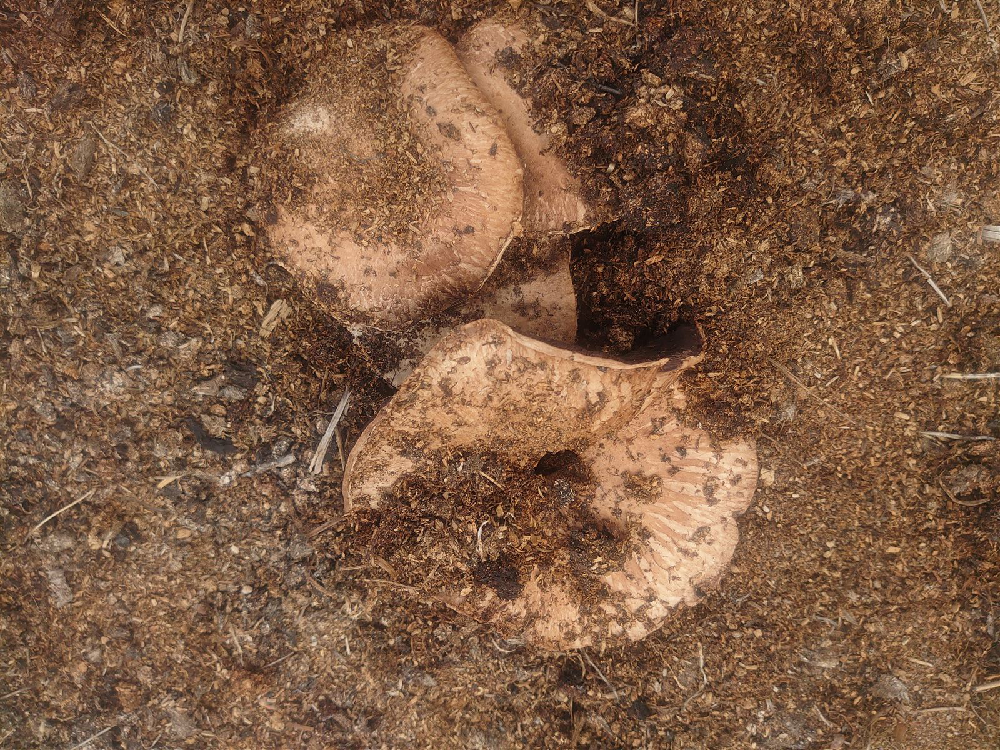

In [64]:
agaricus_bisporus = list(dataset_directory.glob('Agaricus bisporus (J.E.Lange) Imbach/*'))
PIL.Image.open(str(agaricus_bisporus[0]))

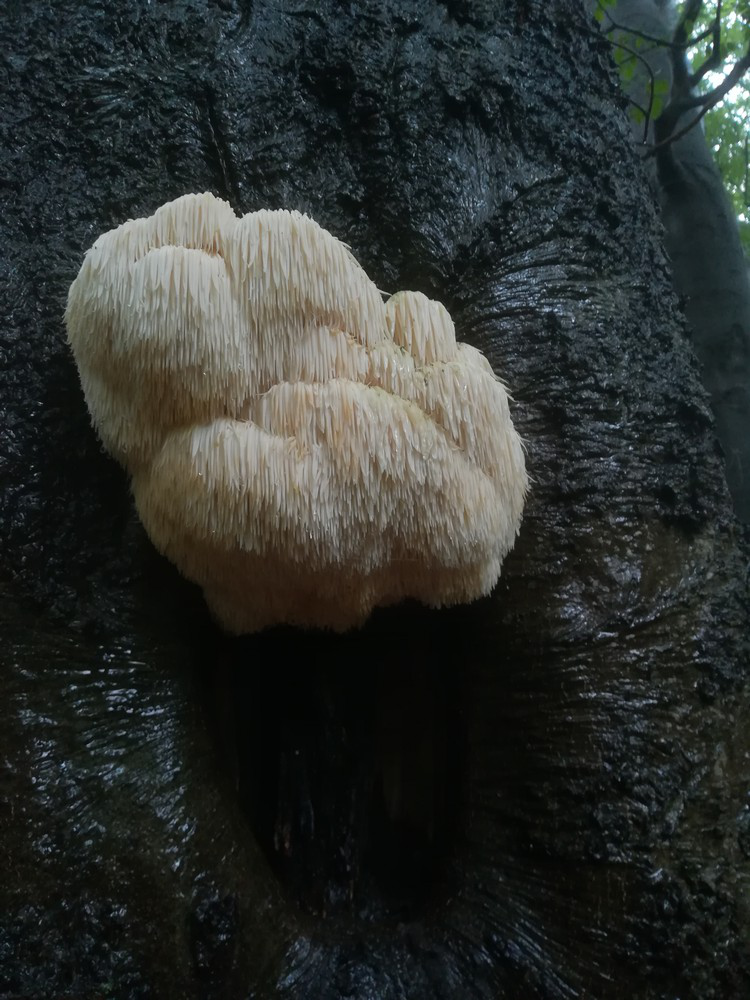

In [ ]:
hericium_erinaceus = list(dataset_directory.glob('Hericium erinaceus (Bull.) Pers/*'))
PIL.Image.open(str(hericium_erinaceus[0]))

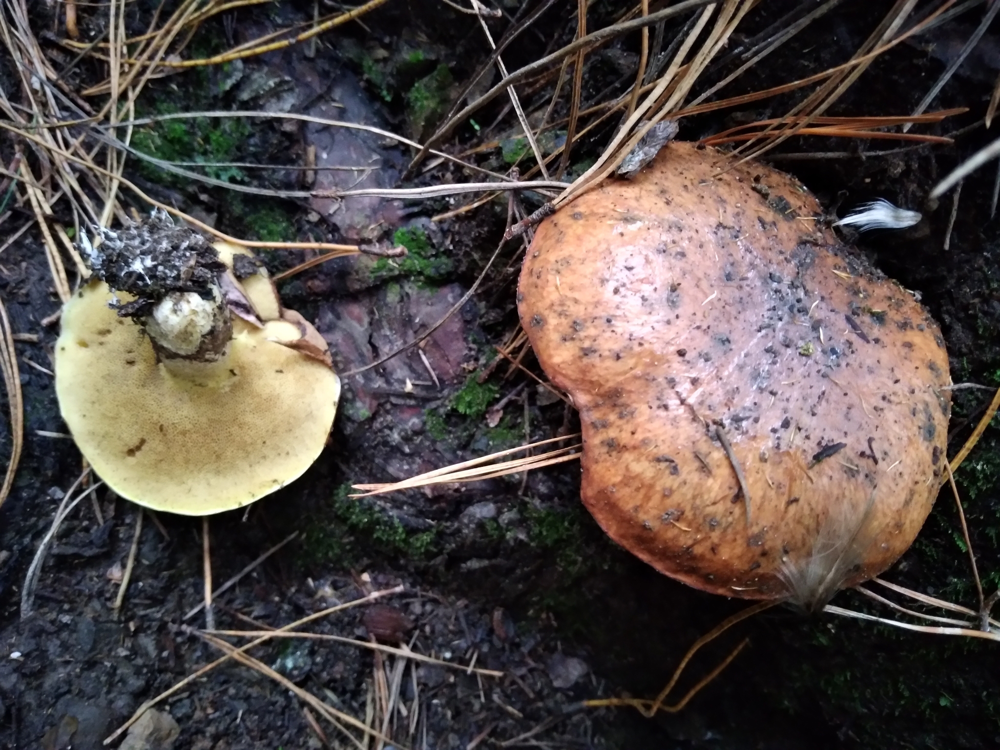

In [ ]:
suillus_luteus = list(dataset_directory.glob('Suillus luteus (L.) Roussel/*'))
PIL.Image.open(str(suillus_luteus[0]))

## **Load Data Using a Keras Utility**

### **Creating the Dataset**

In [65]:
batch_size = 16
img_height = 224
img_width = 224

In [66]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  dataset_directory,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3400 files belonging to 17 classes.
Using 2720 files for training.


In [67]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  dataset_directory,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3400 files belonging to 17 classes.
Using 680 files for validation.


In [68]:
class_names = train_ds.class_names
print(class_names)

['Agaricus bisporus (J.E.Lange) Imbach', 'Amanita caesarea (Scop.) Pers', 'Auricularia auricula-judae', 'Boletus badius (Fr.) Fr', 'Cantharellus cibarius Fr', 'Flammulina velutipes (Curtis) Singer', 'Gomphus clavatus (Pers.) Gray', 'Gymnopus (Pers.) Roussel', 'Hericium erinaceus (Bull.) Pers', 'Laetiporus sulphureus (Bull.) Murrill', 'Macrolepiota procera (Scop.) Singer', 'Morchella esculenta (L.) Pers', 'Phallus indusiatus Vent', 'Pleurotus ostreatus (Jacq.) P.Kumm', 'Russula cyanoxantha (Schaeff.) Fr', 'Sparassis Fr', 'Suillus luteus (L.) Roussel']


### **Visualize the Data**

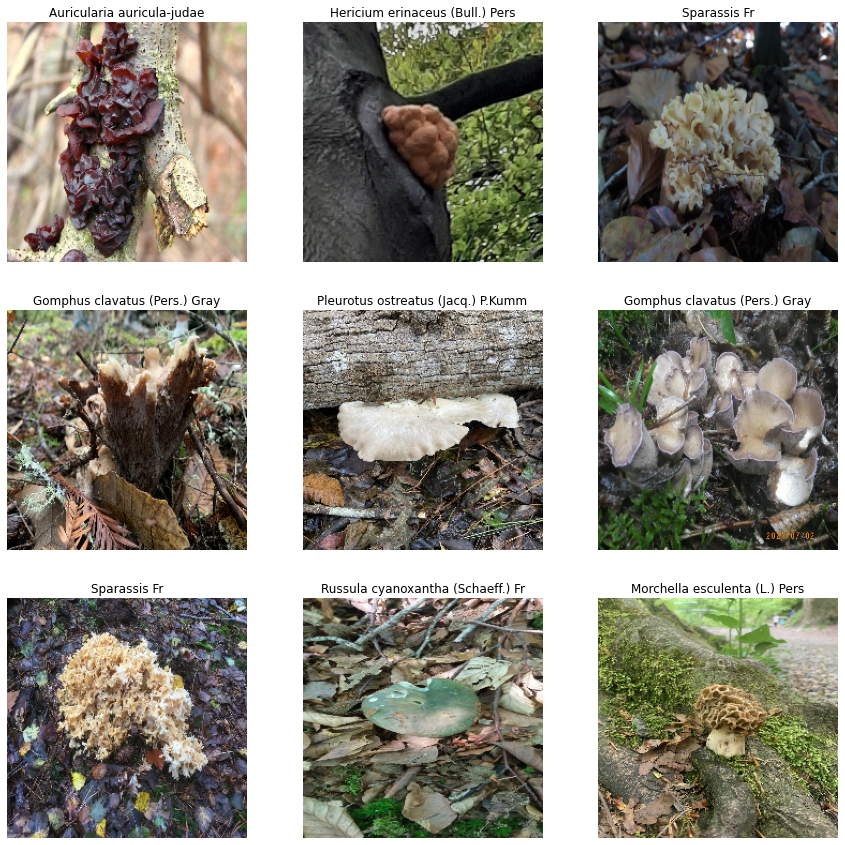

In [70]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 15))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [71]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(16, 224, 224, 3)
(16,)


### **Configuring the Dataset for Performance**

In [72]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

### **Standardize the Data**

In [73]:
normalization_layer = layers.Rescaling(1./255)

In [74]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


### **Augment the Data**

In [75]:
data_augmentation = keras.Sequential([
        layers.RandomFlip("horizontal_and_vertical",
                        input_shape=(img_height,
                                    img_width,
                                    3)),
        layers.RandomRotation(0.2),
        layers.RandomZoom(0.2),
    ])

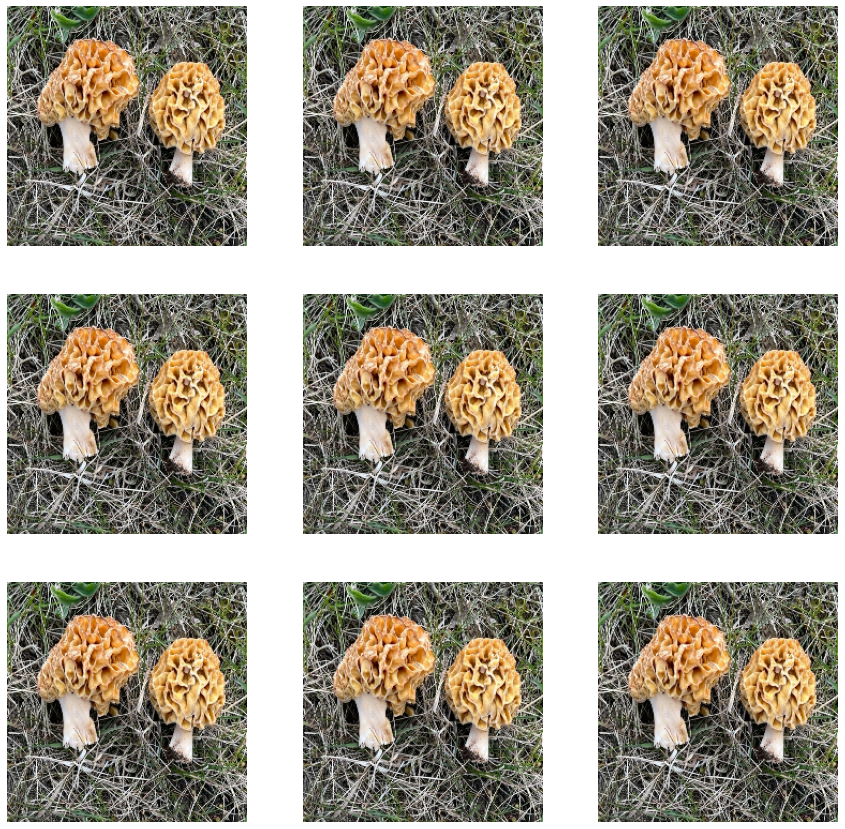

In [76]:
plt.figure(figsize=(15, 15))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

## **Training the Model**

### **Create the Base Model using ResNet50**

In [77]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input, ResNet50
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

base_model = ResNet50(weights="imagenet")
base_model.summary()


Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

### **Create the Model**

In [79]:
num_classes = len(class_names)

last_layer = base_model.get_layer("avg_pool")
resnet_layers = Model(inputs=base_model.inputs, outputs=last_layer.output)

model = Sequential()
model.add(resnet_layers)
model.add(Dense(num_classes, activation='softmax'))
model.layers[0].trainable=False

model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model_4 (Functional)        (None, 2048)              23587712  
                                                                 
 dense_3 (Dense)             (None, 17)                34833     
                                                                 
Total params: 23,622,545
Trainable params: 34,833
Non-trainable params: 23,587,712
_________________________________________________________________


### **Compile the Model**

In [80]:
model.compile(loss = 'sparse_categorical_crossentropy', optimizer="adam", metrics=["accuracy"])

### **Define the Callback**

In [81]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

checkpoint = ModelCheckpoint("Model1.h5", monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', save_freq="epoch")
early_stop = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.1,
                              mode='max', cooldown=2, patience=2, min_lr=0)

### **Train the Model**

In [82]:
epochs = 6
history = model.fit(
    train_ds,
    validation_data = val_ds,
    epochs=epochs,
    callbacks=[checkpoint, early_stop, reduce_lr]
)

Epoch 1/6
170/170 [==============================] - ETA: 0s - loss: 1.4146 - accuracy: 0.5710
Epoch 1: val_accuracy improved from -inf to 0.70735, saving model to Model1.h5
170/170 [==============================] - 565s 3s/step - loss: 1.4146 - accuracy: 0.5710 - val_loss: 0.8937 - val_accuracy: 0.7074 - lr: 0.0010
Epoch 2/6
170/170 [==============================] - ETA: 0s - loss: 0.5852 - accuracy: 0.8154
Epoch 2: val_accuracy improved from 0.70735 to 0.75147, saving model to Model1.h5
170/170 [==============================] - 557s 3s/step - loss: 0.5852 - accuracy: 0.8154 - val_loss: 0.7839 - val_accuracy: 0.7515 - lr: 0.0010
Epoch 3/6
170/170 [==============================] - ETA: 0s - loss: 0.3782 - accuracy: 0.8908
Epoch 3: val_accuracy did not improve from 0.75147
170/170 [==============================] - 548s 3s/step - loss: 0.3782 - accuracy: 0.8908 - val_loss: 0.8672 - val_accuracy: 0.7191 - lr: 0.0010
Epoch 4/6
170/170 [==============================] - ETA: 0s - loss:

### **Visualize Training Results**

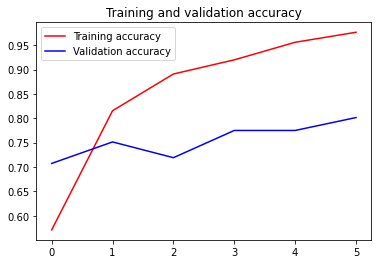

<Figure size 432x288 with 0 Axes>

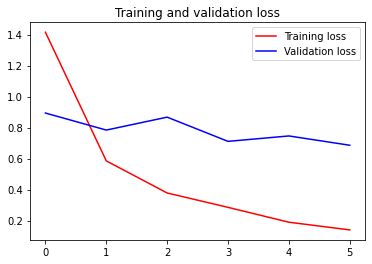

<Figure size 432x288 with 0 Axes>

In [86]:
# Plot the results
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()
plt.show()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=1)
plt.figure()
plt.show()

### **Save the Model**

In [87]:
#model.save("mushrooms.h5")
saved_model = tf.keras.models.load_model("Model1.h5")

In [88]:
import cv2
def prepare(filepath):
    IMG_SIZE = 224
    img_array = cv2.imread(filepath)
    new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
    return new_array.reshape([1,IMG_SIZE,IMG_SIZE,3])

In [92]:
from numpy import argmax
source_path = "/content/gdrive/MyDrive/Mushroom Dataset"
classes = []

#classes = ['coltsfoot', 'garlic_mustard', 'crimson_clover', .....]
for filename in os.listdir(source_path):
    classes.append(filename)

print(classes)
prediction = saved_model.predict([prepare('/content/image-414.jpg')])
print(prediction[0])

['Boletus badius (Fr.) Fr', 'Cantharellus cibarius Fr', 'Russula cyanoxantha (Schaeff.) Fr', 'Pleurotus ostreatus (Jacq.) P.Kumm', 'Gomphus clavatus (Pers.) Gray', 'Flammulina velutipes (Curtis) Singer', 'Sparassis Fr', 'Laetiporus sulphureus (Bull.) Murrill', 'Phallus indusiatus Vent', 'Morchella esculenta (L.) Pers', 'Suillus luteus (L.) Roussel', 'Gymnopus (Pers.) Roussel', 'Agaricus bisporus (J.E.Lange) Imbach', 'Amanita caesarea (Scop.) Pers', 'Auricularia auricula-judae', 'Hericium erinaceus (Bull.) Pers', 'Macrolepiota procera (Scop.) Singer']
[1.2203866e-03 9.9886464e-08 1.1118843e-09 1.5477515e-06 2.4516124e-08
 1.6472153e-09 9.7153243e-05 3.7772313e-08 4.9532326e-05 1.9393335e-08
 1.0859971e-03 1.2881095e-05 9.9674618e-01 4.3967470e-06 7.6336315e-04
 8.4045683e-07 1.7507182e-05]
